# 神经网络去雨测试

直接读取`derain-model-train.ipynb`训练得到的模型测试，模型保存的文件目录在`models/model.h5`

In [1]:
# 导入模块
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2

# 动态分配显存，防止显存爆满

physical_device = tf.config.experimental.list_physical_devices("GPU")
tf.config.experimental.set_memory_growth(physical_device[0], True)

In [2]:
# 读取模型
model = load_model("../models/model256.h5")

## 测试MES与PSNR

读取测试数据集，目录在`datasets/derain/test_syn/`

In [3]:
image_shape = (256, 256)
test_path = '../datasets/derain/test_syn/'
images = []
for i in os.listdir(test_path):
    images.append(cv2.imread(test_path + i))
len(images)

100

图像需要做一点点的预处理：

* 将图像分为两半，左边部分为没雨的图像，右边为有雨的图像
* 然后有雨图像和没雨的图像都需要将形状变换到与神经网络对应的形状即 512 x 512
* 最后是将数值规范到 0-1 范围内

In [4]:
# 分割图像，获得有雨的一半和没雨的一半
test_rain = []
test_derain = []
for i in images:
    col = i.shape[1]
    im = cv2.resize(i[:, :col//2, :], (image_shape[0], image_shape[1]))/255
    im2 = cv2.resize(i[:, col//2:, :], (image_shape[0], image_shape[1]))/255
    test_derain.append(im)
    test_rain.append(im2)

In [5]:
len(test_rain)

100

In [6]:
len(test_derain)

100

In [7]:
# 将list转换为array
rain_arr = np.asarray(test_rain)
derain_arr = np.asarray(test_derain)

In [8]:
rain_arr.shape

(100, 256, 256, 3)

In [9]:
derain_arr.shape

(100, 256, 256, 3)

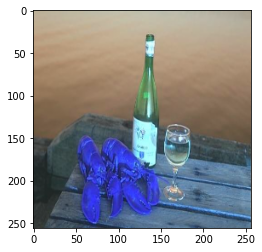

In [10]:
plt.imshow(derain_arr[0])

以下代码是对测试数据集进行预测，为了防止显存再次爆满，每次放1张图片预测，然后汇总

In [11]:
# 通过神经网络模型去雨
predict_list = []
for i in range(rain_arr.shape[0]):
    x = model.predict(rain_arr[i].reshape([1, image_shape[1], image_shape[0], 3]))
    predict_list.append(x.reshape([image_shape[1], image_shape[0], 3]))
predict_arr = np.asarray(predict_list)

In [12]:
predict_arr.shape

(100, 256, 256, 3)

In [13]:
# 计算mse
mse = ((derain_arr-predict_arr)**2).mean()
mse

0.009427409359680656

In [14]:
# 计算psnr
psnr = 20*np.log10(1/(mse**(1/2.0)))
psnr

20.25607634449233

## 绘制图片展示

绘制通过神经网络处理前后的对比图片，随机选择五张图片，分为三列显示，左边一列为没有雨的原图，中间为有雨的图片，右边一列的为神经网络处理后得到的去雨图片

random index: 24
random index: 26
random index: 49
random index: 59
random index: 83


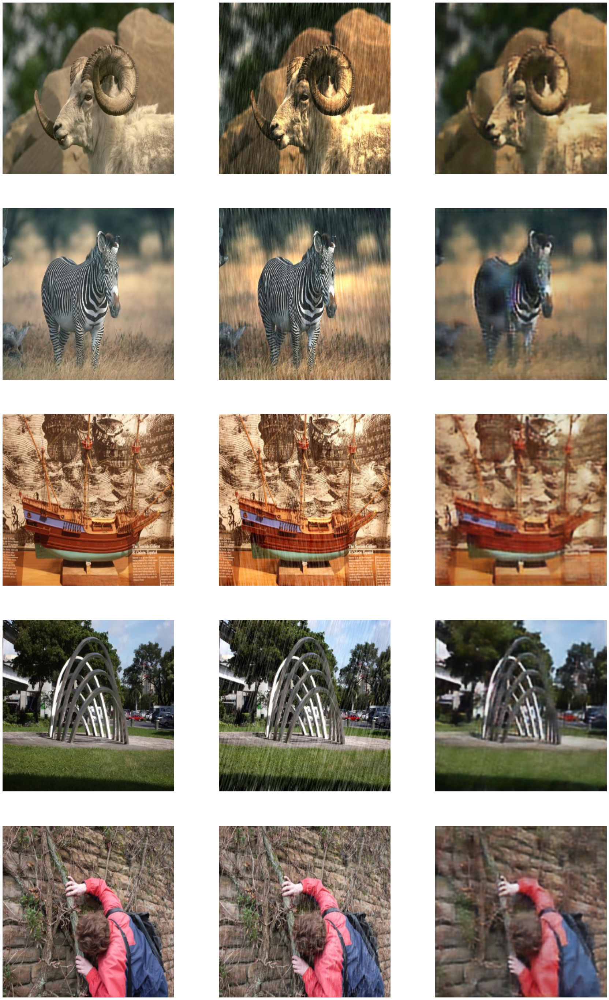

In [29]:
plt.figure(figsize=(30, 50))
for i in range(5):
    im_index = np.random.randint(rain_arr.shape[0])
    print('random index:', im_index)
    im1 = derain_arr[im_index].reshape(image_shape[1], image_shape[0], 3)
    im2 = rain_arr[im_index].reshape(image_shape[1], image_shape[0], 3)
    im3 = predict_arr[im_index].reshape(image_shape[1], image_shape[0], 3)
    
    plt.subplot(5, 3, i*3+1)
    plt.imshow(im1[:, :, ::-1])
    plt.axis('off')
    plt.subplot(5, 3, i*3+2)
    plt.imshow(im2[:, :, ::-1])
    plt.axis('off')
    plt.subplot(5, 3, i*3+3)
    plt.imshow(im3[:, :, ::-1])
    plt.axis('off')
plt.show()

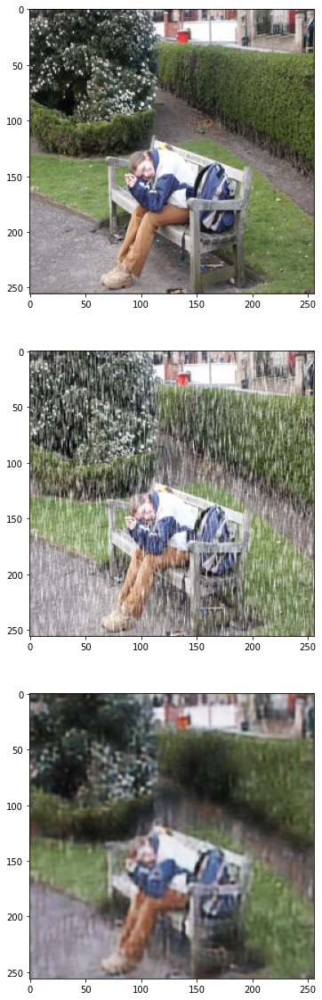

In [27]:
plt.figure(figsize=(20, 20))
rand_index = np.random.randint(len(derain_arr))
img_plot1 = derain_arr[rand_index].reshape(image_shape[1], image_shape[0], 3)
img_plot2 = rain_arr[rand_index].reshape(image_shape[1], image_shape[0], 3)
img_plot3 = predict_arr[rand_index].reshape(image_shape[1], image_shape[0], 3)
plt.subplot(3,1,1)
plt.imshow(img_plot1[:, :, ::-1])
plt.subplot(3,1,2)
plt.imshow(img_plot2[:, :, ::-1])
plt.subplot(3,1,3)
plt.imshow(img_plot3[:, :, ::-1])
plt.show()

## 处理雨视频截图

In [17]:
rain_img = cv2.imread("../img/rainDetected.png")
rain_img_resize = cv2.resize(rain_img, (image_shape[0], image_shape[1]))/255
rain_img_resize.shape

(256, 256, 3)

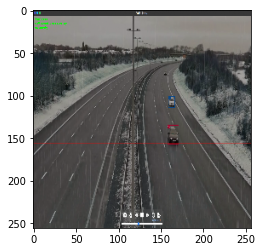

In [18]:
plt.imshow(rain_img_resize)

In [19]:
# 神经网络处理
derain_img = model.predict(rain_img_resize.reshape([1, image_shape[1], image_shape[0], 3]))
derain_img.shape

(1, 256, 256, 3)

In [20]:
derain_img = derain_img.reshape([image_shape[1], image_shape[0], 3])

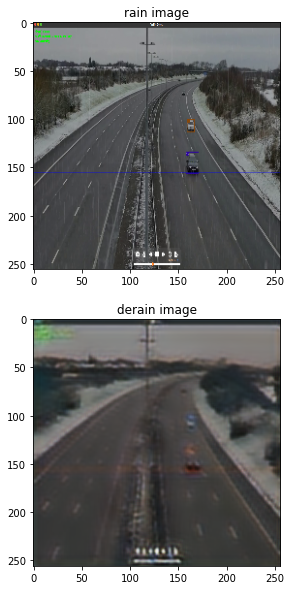

In [21]:
plt.figure(figsize=(20, 10))
plt.subplot(2, 1, 1)
plt.imshow(rain_img_resize[:, :, ::-1])
plt.title("rain image")
plt.subplot(2, 1, 2)
plt.imshow(derain_img)
plt.title("derain image")
plt.show()

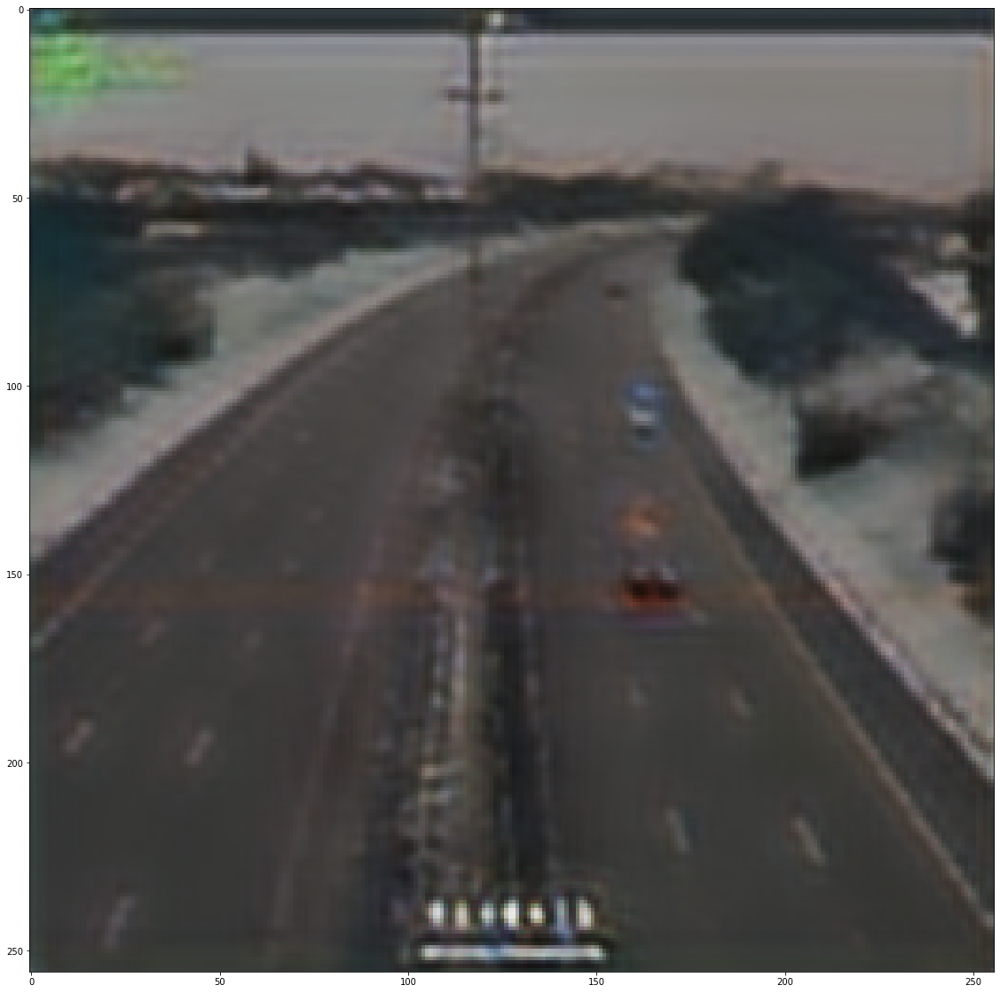

In [22]:
plt.figure(figsize=(20, 20))
plt.imshow(derain_img)
plt.show()

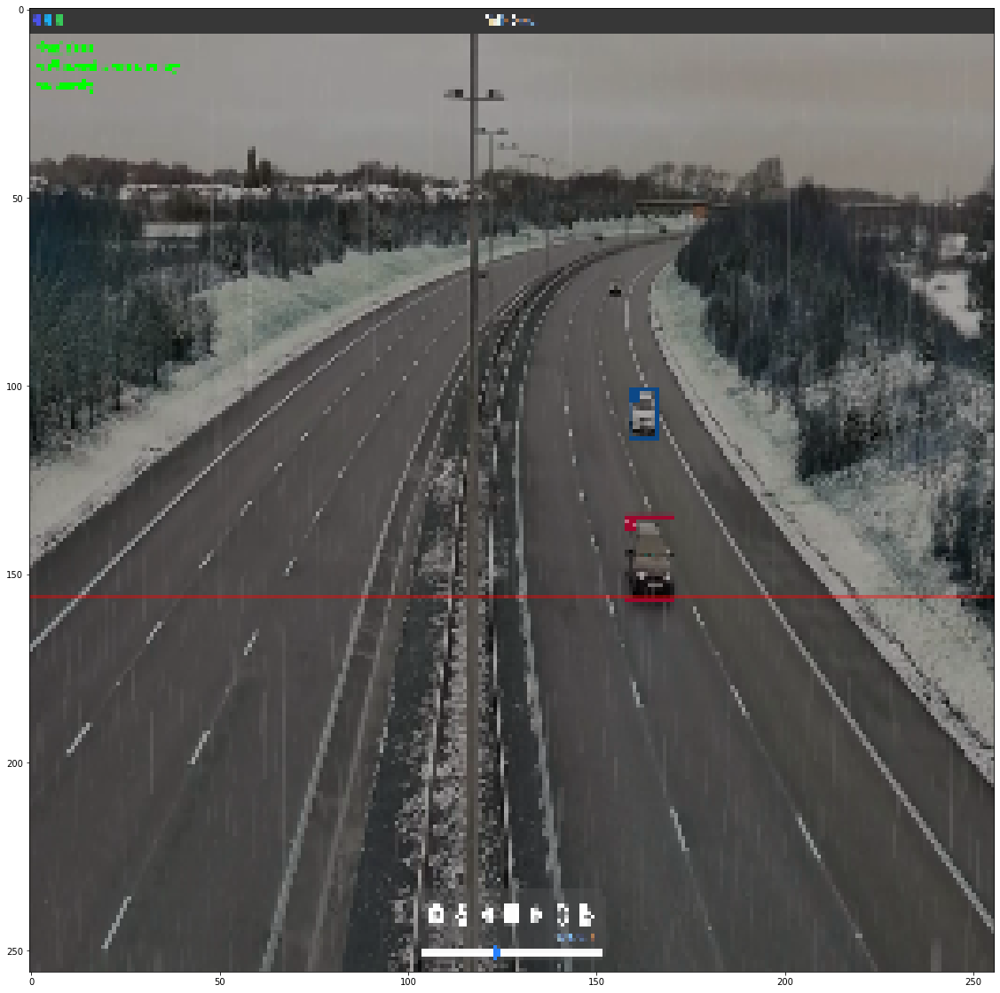

In [23]:
plt.figure(figsize=(20, 20))
plt.imshow(rain_img_resize)
plt.show()